In [8]:
try:
    import google.colab
    google.colab.drive.mount('/content/drive/')
    %cd ../content/drive/Othercomputers/Laptop/Flood_Detection
except:
    pass

In [9]:
import sys; sys.path.append('../../')
from sklearn import svm
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
import numpy as np
from sklearn.metrics import classification_report
from sklearn import metrics
from mlpath import mlquest as mlq
from DataPreparation.DataPreparation import read_data, read_sample
from FeatureExtraction.Resnet.Resnet import apply_deep_features
from FeatureExtraction.Visuals import illustrate3DFeatures
from sklearn.metrics import classification_report
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import f1_score
from tqdm import tqdm
import albumentations.pytorch as AP
mlq.start_quest("Deep-SVM", table_dest="../../", log_defs=True)

### Reading and Preprocessing

In [10]:
more_transforms = [AP.transforms.ToTensorV2()]          # PyTorch deals with tensors on the GPU not numpy arrays
x_train_d, x_val_d, y_train_d, y_val_d = mlq.l(read_data)(gray=False, normalize=True, new_size=224,
                                                          more_transforms=more_transforms, saved=True)

x_train shape:  (737,)
x_val shape:  (185,)


### Feature Extraction: Deep Features (Resnet)

In [11]:
x_train_f, x_val_f = mlq.l(apply_deep_features)(x_train_d, x_val_d, saved=True)

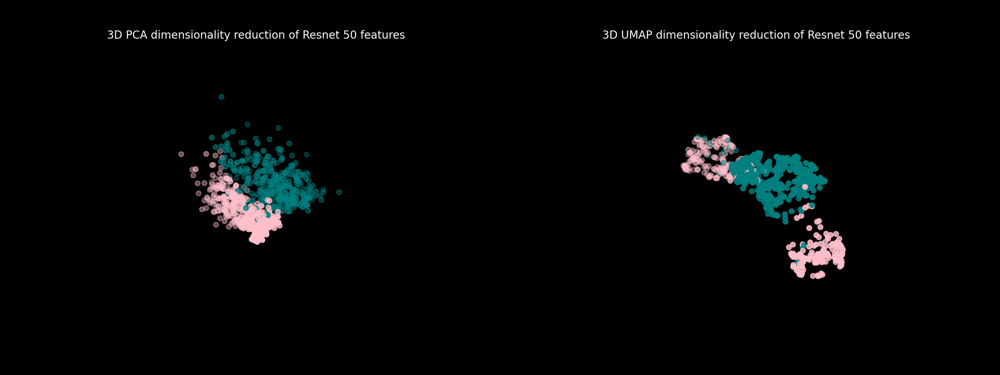

In [50]:
illustration = illustrate3DFeatures(x_train_f, y_train_d, "Resnet 50")
illustration.double_gif(animated=True, useOld=True)

### Initiating the Model

In [12]:
model = mlq.l(svm.SVC)( C=7, kernel='rbf')

In [ ]:

# Hyperparameter search with RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform, uniform

param_dist = {'C': loguniform(1e0, 1e5), 'gamma': loguniform(1e-5, 1e-3), 'kernel': ['rbf']}

search = RandomizedSearchCV(model, param_dist, cv=5, n_iter=300, scoring='f1', verbose=1, n_jobs=-1)
search.fit(x_train_f, y_train_d)
opt_params_rbf = search.best_params_
print("Best score rbf: %0.3f" % search.best_score_)


### Training the Model

In [13]:
model.fit(x_train_f, y_train_d)

SVC(C=7)

### Validating the Model

In [14]:
F1 = metrics.f1_score(y_val_d, model.predict(x_val_f), average='macro').item()
Accuracy = metrics.accuracy_score(y_val_d, model.predict(x_val_f)).item()
mlq.log_metrics(Accuracy, F1)
report = classification_report(y_val_d, model.predict(x_val_f), digits=3)
print(report)

              precision    recall  f1-score   support

           0      0.967     1.000     0.983        87
           1      1.000     0.969     0.984        98

    accuracy                          0.984       185
   macro avg      0.983     0.985     0.984       185
weighted avg      0.984     0.984     0.984       185



### Error Analysis

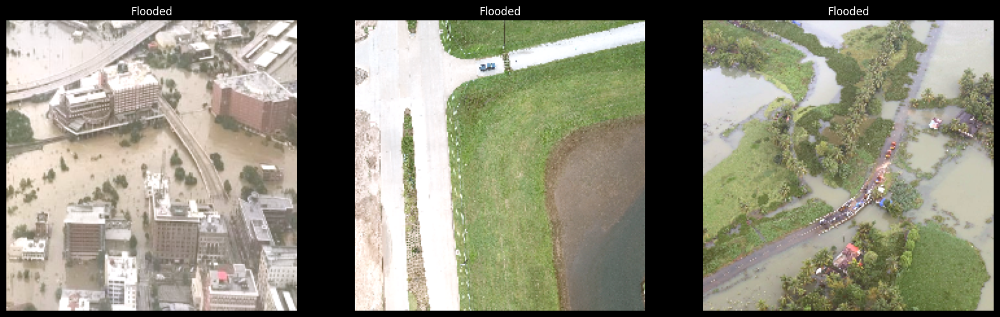

In [15]:
mistake_inds = np.where(y_val_d != model.predict(x_val_f))[0]

# Let's plot all the images with an error
import matplotlib.pyplot as plt
plt.style.use('dark_background')
import torch

# plot the miscalssified images
fig, axs = plt.subplots(1, len(mistake_inds), figsize=(20, 20))
for i, ind in enumerate(mistake_inds):
    img = x_val_d[ind].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img = np.clip(img, 0, 1)
    axs[i].imshow(img)
    # set flooded or not labels
    if y_val_d[ind] == 1:
        axs[i].set_title("Flooded")
    else:
        axs[i].set_title("Not Flooded")
    axs[i].axis('off')
plt.show()


### Tracking

In [16]:
mlq.end_quest()
mlq.show_logs(quest_name='Deep-SVM', table_dest='../../', last_k=5)

### Cross Validation

In [17]:
def CV_Evaluate(model, x_data, y_data):
    """
    Evaluates the performance (F1) of the given model using leave-one-out or repeated KFold cross validation.
    The fact that the function is defined here is a violation to the standards of ths project [Awaiting Fix]
    """
    cval = RepeatedKFold(n_splits=5, n_repeats=10, random_state=42)
    f1_scores = []
    for i, j in tqdm(cval.split(x_data)):           # splits yields indecies of the points in the current split
        x_train, x_val = x_data[i], x_data[j]
        y_train, y_val = y_data[i], y_data[j]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_val)
        f1_scores.append(f1_score(y_val, y_pred))
    mean_f1_score = sum(f1_scores) / len(f1_scores)
    var_f1_score = sum((f1_scores[i] - mean_f1_score)**2 for i in range(len(f1_scores))) / len(f1_scores)
    return mean_f1_score, var_f1_score

# merge x_train_d and x_val_d
x_data_f = np.concatenate((x_train_f, x_val_f), axis=0)
y_data_d = np.concatenate((y_train_d, y_val_d), axis=0)

#### Repeated K-Fold Cross Validation

In [18]:
F1 = CV_Evaluate(model, x_data_f, y_data_d)



50it [00:20,  2.38it/s]

F1 score of Deep-SVM using RKF: (0.9776751709273818, 0.0001244578316113899)


In [19]:

print(f"F1 score of Deep-SVM using RKF: {F1}")

F1 score of Deep-SVM using RKF: (0.9776751709273818, 0.0001244578316113899)
